# CMS ex situ GIWAXS 2023C2

# CMS GIWAXS raw data processing & exporting notebook
In this notebook you output xr.DataSets stored as .zarr stores containing all your raw,
remeshed (reciprocal space), and caked CMS GIWAXS data. Saving as a zarr automatically converts the array to a dask array

In [1]:
### Kernel updates if needed, remember to restart kernel after running this cell!:
!pip install -e /nsls2/users/alevin/repos/PyHyperScattering  # to use pip to install via directory

Obtaining file:///nsls2/users/alevin/repos/PyHyperScattering
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for PyHyperScattering (pyproject.toml) ... done
  Created wheel for PyHyperScattering: filename=PyHyperScattering-0+untagged.539.gefb043c-0.editable-py3-none-any.whl size=5434 sha256=cb53e6acd90a41abc470af841408d1cd723390ca455ae203e89b73b51dcf3669
  Stored in directory: /tmp/pip-ephem-wheel-cache-xxgfg3i8/wheels/7d/89/c7/db1d0cb1cf714f3a03a438abee7b78ce09921efd15259b1f5f
Successfully built PyHyperScattering
  Attempting uninstall: PyHyperScattering
    Found existing installation: PyHyperScattering 0.2.1
    Uninstalling PyHyperScattering-0.2.1:
      Successfully uninstalled PyHyperScattering-0.2.1


## Imports

In [4]:
### Imports:
import pathlib
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import xarray as xr
import PyHyperScattering as phs
import pygix
import gc
from tqdm.auto import tqdm  # progress bar loader!

print(f'Using PyHyperScattering Version: {phs.__version__}')

/nsls2/users/alevin/repos/PyHyperScattering/src/PyHyperScattering/integrate.py:3: UserWarning: Could not import CuPy or ndigpu.  If you expect this machine to support CuPy, check dependencies.  Falling back to scikit-image/numpy CPU integration.
  from PyHyperScattering.WPIntegrator import WPIntegrator


Using PyHyperScattering Version: 0.2.1+92.g6553b20


## Defining some objects

### Define & check paths

In [22]:
def select_attrs(data_arrays_iterable, selected_attrs_dict):
    """
    Selects data arrays whose attributes match the specified values.

    Parameters:
    data_arrays_iterable: Iterable of xarray.DataArray objects.
    selected_attrs_dict: Dictionary where keys are attribute names and 
                         values are the attributes' desired values.

    Returns:
    List of xarray.DataArray objects that match the specified attributes.
    """    
    sublist = list(data_arrays_iterable)
    
    for attr_name, attr_values in selected_attrs_dict.items():
        sublist = [da for da in sublist if da.attrs[attr_name] in attr_values]
                
    return sublist

In [54]:
pix_size = 0.000172
651 * pix_size

0.111972

In [55]:
# I like pathlib for its readability & checkability, it's also necessary for the loadSeries function later on
# Replace the paths with the ones relevant to your data, you can use the ".exists()" method to make sure you defined a path correctly
userPath = pathlib.Path('/nsls2/users/alevin')
propPath = pathlib.Path('/nsls2/data/cms/proposals/2023-2/pass-311415')
dataPath = propPath.joinpath('KWhite4/waxs')
samplesPath = dataPath.joinpath('stitched')
maskponiPath = userPath.joinpath('giwaxs_suite/beamline_data/maskponi')  # place for pyhyper-drawn masks and poni files
outPath = propPath.joinpath('AL_processed_data')

# Select poni & mask filepaths
poniFile = maskponiPath.joinpath('AgBH_x444p6_y651.poni')
maskFile = maskponiPath.joinpath('pilatus1m_vertical_gaps_only.json')

# Create pg Transform objects with the above information:
# Can set the energy to overwrite default poni energy, this MUST be correct for your samples!
transformer = phs.GIWAXS.Transform(poniPath=poniFile, maskPath=maskFile, energy=12.7)
# bc_transformer = phs.GIWAXS.Transform(poniPath=poniFile, maskPath=maskFile, energy=17)  # one of my sample sets was at a different energy

# Colormap
cmap = plt.cm.turbo
cmap.set_bad('black')

In [56]:
def poni_centers(poniFile, pix_size=0.000172):
    """
    Returns poni center value and the corresponding pixel position. Default pixel size is 172 microns (Pilatus 1M)
    
    Inputs: poniFile as pathlib path object to the poni file
    Outputs: ((poni1, y_center), (poni2, x_center))
    """
    
    with poniFile.open('r') as f:
        lines = list(f.readlines())
    poni1_str = lines[6]
    poni2_str = lines[7]

    poni1 = float(poni1_str.split(' ')[1])
    poni2 = float(poni2_str.split(' ')[1])

    y_center = poni1 / pix_size
    x_center = poni2 / pix_size
        
    return ((poni1, y_center), (poni2, x_center))

poni_centers(poniFile)

((0.111972, 651.0), (0.07647238153088184, 444.6068693655921))

### Define metadata naming scheme & initialize loaders

In [57]:
# set ex situ metadata filename naming schemes:
PM6_md_naming_scheme = ['project', 'polymer', 'weight_percent', 'detector_pos', 'sample_pos', 'incident_angle',
                        'exposure_time', 'scan_id', 'detector', 'stitched']

ASeries_md_naming_scheme = ['project', 'film', 'detector_pos', 'sample_pos', 'incident_angle', 'exposure_time',
                            'scan_id', 'detector', 'stitched']

bc_md_naming_scheme = ['project', 'sample_id', 'detector_pos', 'sample_pos', 'incident_angle', 'exposure_time',
                       'scan_id', 'detector', 'stitched']

# Initalize CMSGIWAXSLoader objects with the above naming schemes
PM6_loader = phs.load.CMSGIWAXSLoader(md_naming_scheme=PM6_md_naming_scheme)
ASeries_loader = phs.load.CMSGIWAXSLoader(md_naming_scheme=ASeries_md_naming_scheme)
bc_loader = phs.load.CMSGIWAXSLoader(md_naming_scheme=bc_md_naming_scheme)

## Data processing
Break this section up however makes sense for your data

### A1-3 acceptor series set

In [45]:
# loader = phs.load.CMSGIWAXSLoader()
# calibPath = pathlib.Path('/nsls2/data/cms/proposals/2023-2/pass-311415/KWhite5/maxs/raw/LaB6_5.6m_12.7keV_4250.1s_x0.001_th0.120_10.00s_1118442_maxs.tiff')
# LaB6_DA = loader.loadSingleImage(calibPath)  # Loads the file specified at calibPath into an xr.DataArray object

In [44]:
# # Load a mask as np.array (can use any method)
# draw = phs.IntegrationUtils.DrawMask(LaB6_DA)
# # draw.load(maskponiPath.joinpath('stitched_waxs.json'))
# # draw.load(maskponiPath.joinpath('blank.json'))
# draw.load(maskponiPath.joinpath('pilatus1m_vertical_gaps_only.json'))

# mask = draw.mask  # Loads mask as numpy array

# # Show np.array mask:
# plt.imshow(mask)
# plt.colorbar()

# # Initialize a transformer:
# transformer = phs.GIWAXS.Transform(poniPath=poniFile, maskPath=maskFile, energy=12.7)

In [58]:
# Define a sample set & check it
ASeries_set = sorted(set(samplesPath.glob("KW*_A*")).union(set(samplesPath.glob("KW*D18*"))))
# sorted(ASeries_set)  # may need to set a key to sort by a specific value within the string, see bladecoated set a bit further down for an example of this

In [59]:
raw_DS, recip_DS, caked_DS = phs.GIWAXS.single_images_to_dataset(sorted(ASeries_set), ASeries_loader, transformer)

Transforming Raw Data:   0%|          | 0/29 [00:00<?, ?it/s]

No save path or no filename specified, not saving zarrs... 


### 2D reciprocal space images

  0%|          | 0/3 [00:00<?, ?it/s]

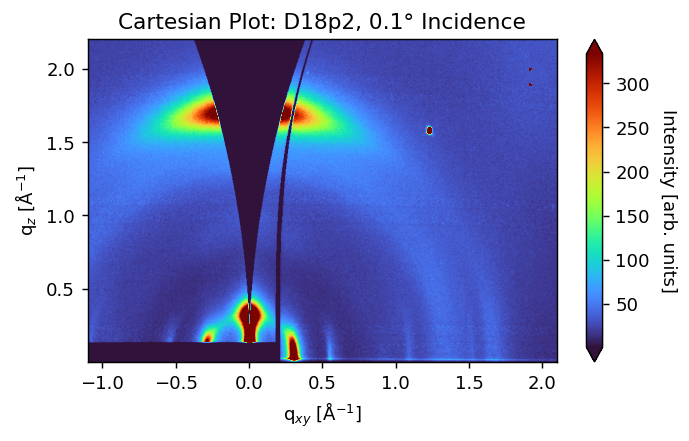

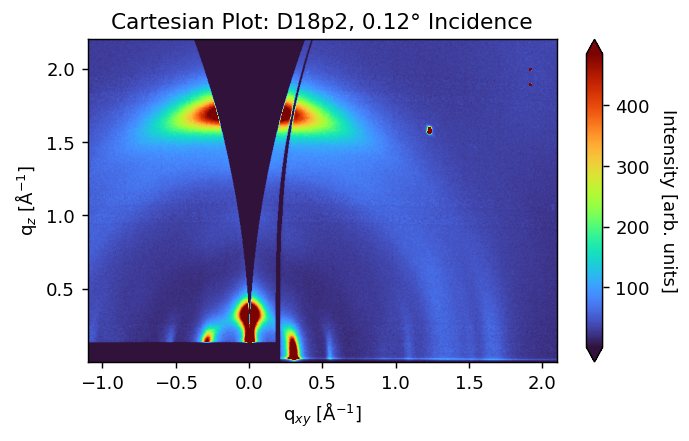

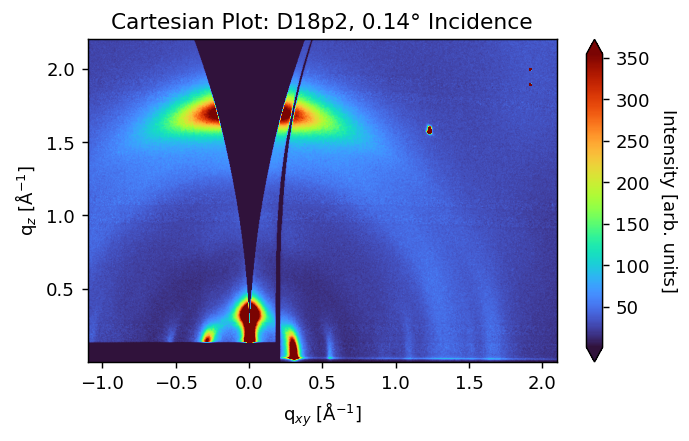

In [61]:
# 2D reciprocal space cartesian plots
qxy_min = -1.1
qxy_max = 2.1
qz_min = 0
qz_max = 2.2

savePath = outPath.joinpath('A1-3set_waxs/recip_plots_v1')

selected_attrs_dict = {'film': ['D18p2']}
selected_DAs = select_attrs(recip_DS.data_vars.values(), selected_attrs_dict)

for DA in tqdm(selected_DAs):
    # Slice data for selected q ranges (will need to rename q_xy if dimensions are differently named)
    sliced_DA = DA.sel(q_xy=slice(qxy_min, qxy_max), q_z=slice(qz_min, qz_max))
    
    real_min = float(sliced_DA.compute().quantile(0.01))
    cmin = 1 if real_min < 1 else real_min

    cmax = float(sliced_DA.compute().quantile(0.995))   
    
    # Plot
    ax = sliced_DA.plot.imshow(cmap=cmap, norm=plt.Normalize(cmin, cmax), interpolation='antialiased', figsize=(5.5,3.3))
    ax.colorbar.set_label('Intensity [arb. units]', rotation=270, labelpad=15)
    ax.axes.set(aspect='equal', title=f'Cartesian Plot: {DA.film}, {float(DA.incident_angle[2:])}° Incidence',
                xlabel='q$_{xy}$ [Å$^{-1}$]', ylabel='q$_z$ [Å$^{-1}$]')
    ax.figure.set(tight_layout=True, dpi=130)
    
    # ax.figure.savefig(savePath.joinpath(f'{DA.film}_qxy{qxy_min}to{qxy_max}_qz{qz_min}to{qz_max}_{DA.incident_angle}.png'), dpi=150)
    
    plt.show()
    plt.close('all')

### Yoneda Check

In [49]:
def qz(wavelength, alpha_crit, alpha_incidents):
    qz_inv_meters = ((4 * np.pi) / (wavelength)) * (np.sin(np.deg2rad((alpha_incidents + alpha_crit)/2)))
    # qz_inv_meters = ((4 * np.pi) / (wavelength)) * (np.sin(np.deg2rad(alpha_crit)) + np.sin(np.deg2rad(alpha_incidents)))
    qz_inv_angstroms = qz_inv_meters / 1e10
    return qz_inv_angstroms


wavelength = 9.762535309700809e-11  # 12.7 keV

alpha_crit = 0.11  # organic film critical angle
alpha_incidents = np.array([0.1, 0.12, 0.14])

yoneda_angles = alpha_incidents + alpha_crit

qz(wavelength, alpha_crit, alpha_incidents)

array([0.02358922, 0.02583581, 0.0280824 ])

In [66]:
%matplotlib inline
plt.close('all')

  0%|          | 0/3 [00:00<?, ?it/s]

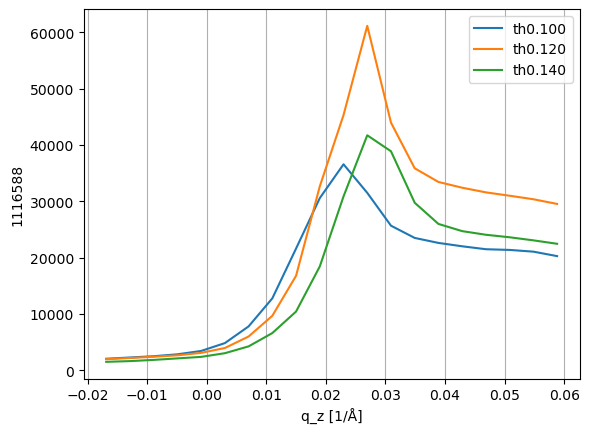

In [68]:
# Yoneda peak linecut check
qxy_min = 0.22
qxy_max = 2
qz_min = -0.02
qz_max = 0.06

# selected_DAs = select_attrs(list(DS.data_vars.values())[:3], selected_attrs_dict)
for DA in tqdm(selected_DAs):
    # Slice data for selected q ranges (will need to rename q_xy if dimensions are differently named)
    sliced_DA = DA.sel(q_xy=slice(qxy_min, qxy_max), q_z=slice(qz_min, qz_max))
    qz_integrated_DA = sliced_DA.sum('q_xy')
    
    # Plot
    qz_integrated_DA.plot.line(label=DA.incident_angle)
    
plt.legend()
plt.grid(visible=True, which='major', axis='x')
plt.show()
plt.close('all')

In [69]:
# # Plot and optionally save selected dataarrays:
# # Set chi range: Full range
# chi_min = -90
# chi_max = 90

# for DA in tqdm(caked_DS.data_vars.values()):
#     # Slice dataarray to select plotting region 
#     sliced_DA = DA.sel(chi=slice(chi_min,chi_max))
    
#     # real_min = float(DA.sel(q_xy=slice(-0.5, -0.1), q_z=slice(0.1, 0.4)).compute().quantile(1e-3))
#     real_min = float(DA.compute().quantile(0.05))
#     cmin = 1 if real_min < 1 else real_min
    
#     # cmax = float(DA.sel(q_xy=slice(-0.5, -0.1), q_z=slice(0.1, 2)).compute().quantile(1))   
#     cmax = float(DA.compute().quantile(0.999))   
    
#     # Plot sliced dataarray
#     ax = sliced_DA.plot.imshow(cmap=cmap, norm=plt.Normalize(cmin, cmax), figsize=(5,4), interpolation='antialiased')  # plot, optional parameter interpolation='antialiased' for image smoothing
#     ax.colorbar.set_label('Intensity [arb. units]', rotation=270, labelpad=15)  # set colorbar label & parameters 
#     ax.axes.set(title=f'Polar Plot: {DA.film}, {float(DA.incident_angle[2:])}° Incidence',
#                 xlabel='q$_r$ [Å$^{-1}$]', ylabel='$\chi$ [°]')  # set title, axis labels, misc
#     ax.figure.set(tight_layout=True, dpi=130)  # Adjust figure dpi & plotting style
    
#     plt.show()  # Comment to mute plotting output
    
#     # Uncomment below line and set savepath/savename for saving plots, I usually like to check 
#     # ax.figure.savefig(outPath.joinpath('PM6-Y6set_waxs', f'polar-2D_{DA.sample_id}_{chi_min}to{chi_max}chi_{DA.incident_angle}.png'), dpi=150)
#     plt.close('all')

In [5]:
# # Useful cell if you need/want to modify sample names in a systematic way
# # I used this to remove an underscore that was only present in some of my files
# # Be careful to not rename samples incorrectly, could easily destroy your data... probably a good idea to have a backup of the raw original-name data
# for f in sorted(ASeries_set):
#     name = f.name
#     if len(name.split('_')) == 10:
#         print(name)
#         # newname = name[:-58] + name[-57:]
#         # print(newname)
#         # f.rename(samplesPath / newname)

In [65]:
outPath

PosixPath('/nsls2/data/cms/proposals/2023-2/pass-311415/AL_processed_data')

In [70]:
savePath = outPath.joinpath('ex_situ_zarrs_v2/bcy651')
savePath

PosixPath('/nsls2/data/cms/proposals/2023-2/pass-311415/AL_processed_data/ex_situ_zarrs_v2/bcy651')

In [71]:
savePath.exists()

True

In [72]:
recip_DS.to_zarr(savePath.joinpath('A1-3set_recip_stitched.zarr'), mode='w')

In [73]:
raw_DS.to_zarr(savePath.joinpath('A1-3set_raw_stitched.zarr'), mode='w')

In [74]:
caked_DS.to_zarr(savePath.joinpath('A1-3set_caked_stitched.zarr'), mode='w')

### PM6:Y6 set

In [5]:
# Define sample set/list, this set is was easy to isolate & sort
PM6_list = sorted(samplesPath.glob("*PM6*"))
PM6_list

[PosixPath('/nsls2/data/cms/proposals/2023-2/pass-311415/KWhite4/waxs/stitched/KW_PM6_00_pos1_x-0.000_th0.100_10.00s_1116475_waxs_stitched.tiff'),
 PosixPath('/nsls2/data/cms/proposals/2023-2/pass-311415/KWhite4/waxs/stitched/KW_PM6_00_pos1_x-0.000_th0.120_10.00s_1116476_waxs_stitched.tiff'),
 PosixPath('/nsls2/data/cms/proposals/2023-2/pass-311415/KWhite4/waxs/stitched/KW_PM6_00_pos1_x-0.000_th0.140_10.00s_1116477_waxs_stitched.tiff'),
 PosixPath('/nsls2/data/cms/proposals/2023-2/pass-311415/KWhite4/waxs/stitched/KW_PM6_100_pos1_x-0.000_th0.100_10.00s_1116469_waxs_stitched.tiff'),
 PosixPath('/nsls2/data/cms/proposals/2023-2/pass-311415/KWhite4/waxs/stitched/KW_PM6_100_pos1_x-0.000_th0.120_10.00s_1116470_waxs_stitched.tiff'),
 PosixPath('/nsls2/data/cms/proposals/2023-2/pass-311415/KWhite4/waxs/stitched/KW_PM6_100_pos1_x-0.000_th0.140_10.00s_1116471_waxs_stitched.tiff'),
 PosixPath('/nsls2/data/cms/proposals/2023-2/pass-311415/KWhite4/waxs/stitched/KW_PM6_60_pos1_x0.000_th0.100_10.00s

In [13]:
phs.GIWAXS.single_images_to_dataset?

Signature:
phs.GIWAXS.single_images_to_dataset(
    files,
    loader,
    transformer,
    savePath=None,
    savename=None,
)
Docstring:
Function that takes an iterable object of filepaths corresponding to raw GIWAXS
beamline data, loads the raw data into an xarray DataArray, generates pygix-transformed 
cartesian and polar DataArrays, and creates 3 corresponding xarray Datasets 
containing a DataArray per sample. The raw dataarrays must contain the attribute 'scan_id'

Inputs: files: indexable object containing pathlib.Path filepaths to raw GIWAXS data
        loader: custom PyHyperScattering GIWAXSLoader object, must return DataArray
        transformer: instance of Transform object defined above, takes raw 
                     dataarray and returns two processed dataarrays
        savePath: optional, required to save zarrs, choose savePath for zarr store
                  pathlib.Path or absolute path as a string
        savename: optional, required to save zarrs, string for name

In [7]:
# Use the single_images_to_dataset function to pygix transform all raw files in an indexable list, optionally save files
raw_DS, recip_DS, caked_DS = phs.GIWAXS.single_images_to_dataset(PM6_list, PM6_loader, pg_transformer,
                                                                 savePath = outPath.joinpath('ex_situ_zarrs'), 
                                                                 savename = 'PM6-Y6set_stitched')

Transforming Raw Data:   0%|          | 0/17 [00:00<?, ?it/s]

Saving zarrs...
Saved!


In [11]:
recip_DS

<xarray.Dataset>
Dimensions:  (q_z: 1043, q_xy: 981)
Coordinates:
  * q_z      (q_z) float64 0.007275 0.009704 0.01213 ... 2.534 2.537 2.539
  * q_xy     (q_xy) float64 -1.219 -1.215 -1.212 -1.209 ... 2.171 2.175 2.178
Data variables: (12/18)
    1116475  (q_z, q_xy) float32 0.0 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    1116476  (q_z, q_xy) float64 nan nan nan nan nan nan ... 0.0 0.0 0.0 0.0 nan
    1116477  (q_z, q_xy) float64 nan nan nan nan nan nan ... 0.0 0.0 0.0 0.0 nan
    1116469  (q_z, q_xy) float64 0.0 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    1116470  (q_z, q_xy) float64 nan nan nan nan nan nan ... 0.0 0.0 0.0 0.0 nan
    1116471  (q_z, q_xy) float64 nan nan nan nan nan nan ... 0.0 0.0 0.0 0.0 nan
    ...       ...
    1116489  (q_z, q_xy) float64 nan nan nan nan nan nan ... 0.0 0.0 0.0 0.0 nan
    1116487  (q_z, q_xy) float64 0.0 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    1116488  (q_z, q_xy) float64 nan nan nan nan nan nan ... 0.0 0.0 0.0 0.0 nan
    1116481  (q_z, q_xy) float64 0.0 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    1116482  (q_z, q_xy) float64 nan nan nan nan nan nan ... 0.0 0.0 0.0 0.0 nan
    1116483  (q_z, q_xy) float64 nan nan nan nan nan nan ... 0.0 0.0 0.0 0.0 nan

In [10]:
# Optional plot check of dataset contents

# for DA in recip_DS.data_vars.values():   
#     ax = DA.sel(q_xy=slice(-1.1, 2.1), q_z=slice(-0.05, 2.4)).plot.imshow(cmap=cmap, norm=LogNorm(1e0, 1e3), figsize=(8,4), interpolation='antialiased')
#     ax.axes.set(aspect='equal', title=f'{DA.scan_id} incident angle: {DA.incident_angle}')
#     plt.show()

### Blade coated set

In [11]:
# Generate sets/lists for samples if necessary to combine/separate different files
# This set the filenaming was strange... challenges of miscommunication during beamtimes when you need to sleep...

# Create separate sets per your data:
ME_set = set(samplesPath.glob("ME*_A*"))
LK_set = set(samplesPath.glob("LK*_A*"))
bc_set = ME_set.union(LK_set)

# Check content of sets
print('Blade coated ex situ sample set:')
# A very pythonic line to get the number to the right of the A and to the left of any 'p' if it exists
key = lambda x: int(''.join([i for i in x.name.split('A')[1].split('_')[0].split('p')[0] if i.isdigit()]))
bc_list = sorted(bc_set, key=key)  # sort by the number we isolated from the filename above using the lambda key
display(bc_list)

Blade coated ex situ sample set:


[PosixPath('/nsls2/data/cms/proposals/2023-2/pass-311415/KWhite4/waxs/stitched/ME_A1_pos1_x-0.000_th0.100_5.00s_1118965_waxs_stitched.tiff'),
 PosixPath('/nsls2/data/cms/proposals/2023-2/pass-311415/KWhite4/waxs/stitched/ME_A1_pos1_x-0.000_th0.500_5.00s_1118969_waxs_stitched.tiff'),
 PosixPath('/nsls2/data/cms/proposals/2023-2/pass-311415/KWhite4/waxs/stitched/ME_A1_pos1_x-0.000_th0.200_5.00s_1118968_waxs_stitched.tiff'),
 PosixPath('/nsls2/data/cms/proposals/2023-2/pass-311415/KWhite4/waxs/stitched/ME_A1_pos1_x-0.000_th0.120_5.00s_1118970_waxs_stitched.tiff'),
 PosixPath('/nsls2/data/cms/proposals/2023-2/pass-311415/KWhite4/waxs/stitched/ME_A1_pos1_x-0.000_th0.140_5.00s_1118967_waxs_stitched.tiff'),
 PosixPath('/nsls2/data/cms/proposals/2023-2/pass-311415/KWhite4/waxs/stitched/ME_A2_pos1_x-0.000_th0.110_5.00s_1118978_waxs_stitched.tiff'),
 PosixPath('/nsls2/data/cms/proposals/2023-2/pass-311415/KWhite4/waxs/stitched/ME_A2_pos1_x-0.000_th0.140_5.00s_1118979_waxs_stitched.tiff'),
 Posix

In [12]:
# Use the single_images_to_dataset function to pygix transform all raw files in an indexable list
raw_DS, recip_DS, caked_DS = phs.GIWAXS.single_images_to_dataset(bc_list, bc_loader, bc_transformer)

Transforming Raw Data:   0%|          | 0/102 [00:00<?, ?it/s]

No save path or no filename specified, not saving zarrs... 


In [13]:
# Select just a few dataarrays to check... useful for when you have large datasets
selected_dataarrays = [da for da in recip_DS.data_vars.values() if 
                       da.attrs['incident_angle'] == 'th0.120']
len(selected_dataarrays)

18

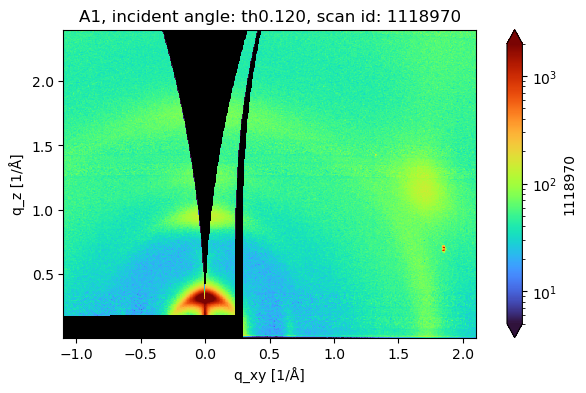

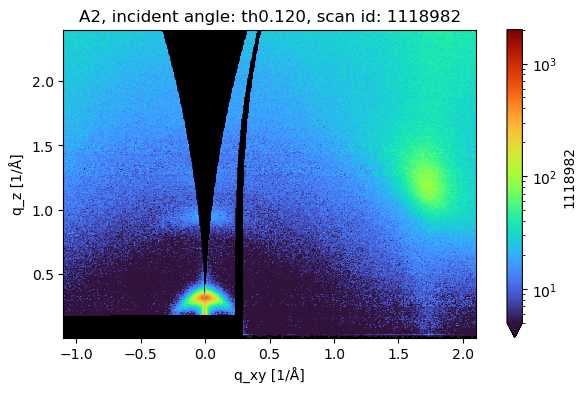

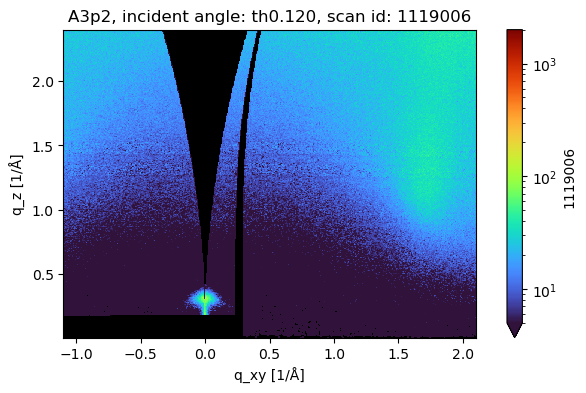

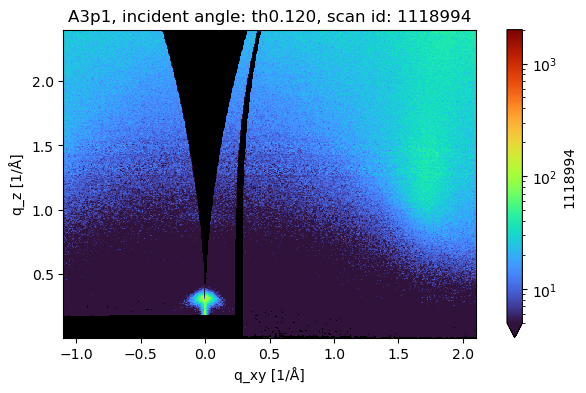

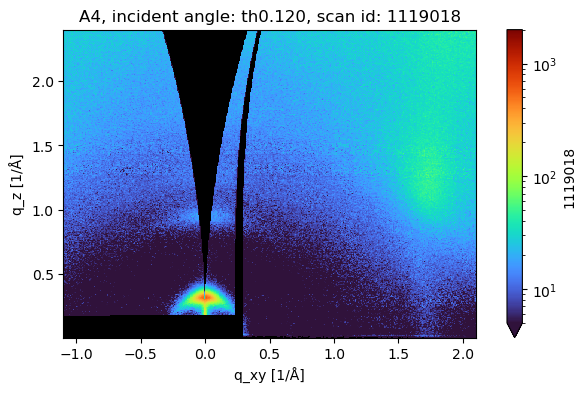

...

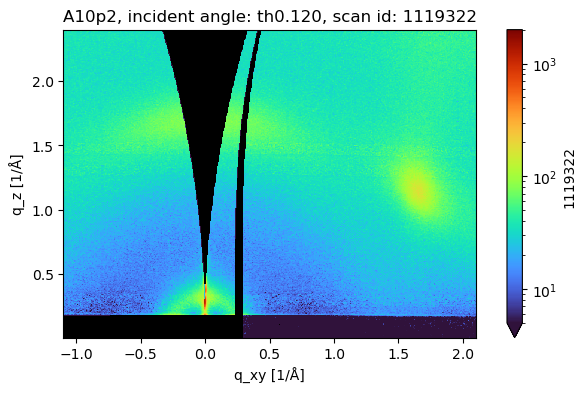

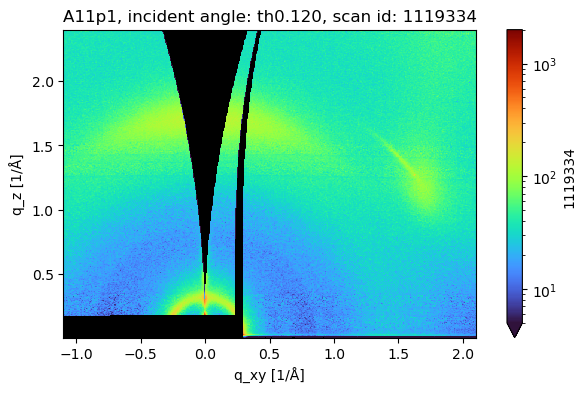

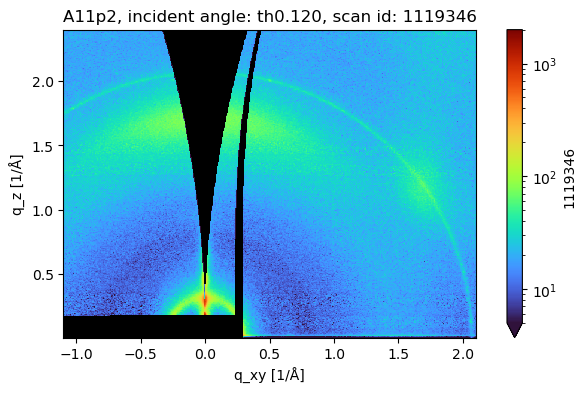

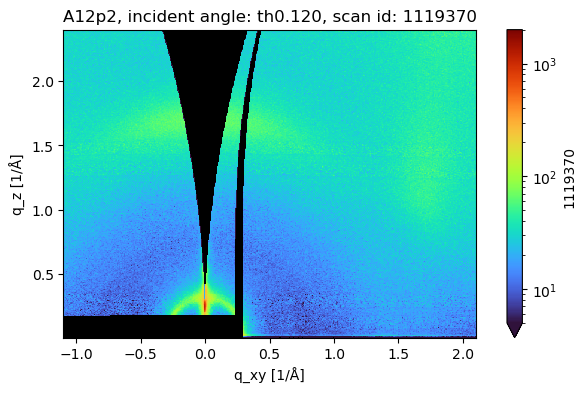

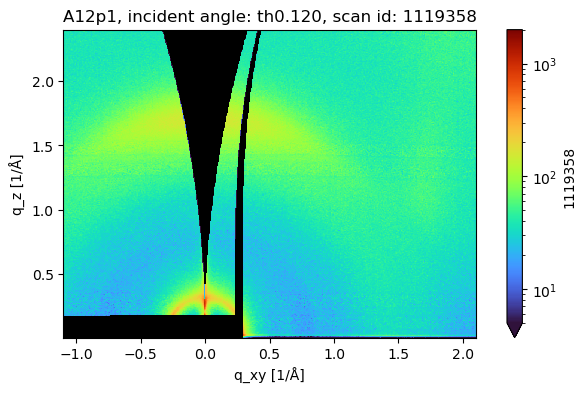

In [14]:
# Optional plot check
for DA in selected_dataarrays:   
    ax = DA.sel(q_xy=slice(-1.1, 2.1), q_z=slice(-0.05, 2.4)).plot.imshow(cmap=cmap, norm=LogNorm(5e0, 2e3), figsize=(8,4))
    ax.axes.set(aspect='equal', title=f'{DA.sample_id}, incident angle: {DA.incident_angle}, scan id: {DA.scan_id}')
    # ax = DA.sel().plot.imshow(cmap=cmap, norm=LogNorm(5e0, 2e3), figsize=(8,4))    
    # ax.axes.set(title=f'{DA.sample_id}, incident angle: {DA.incident_angle}, scan id: {DA.scan_id}')
    plt.show()